<a href="https://colab.research.google.com/github/Dhruv-Sharma01/CS399-Real-Time-Drone-Data-Analysis/blob/main/multiple_image_stitching.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [96]:
# IMPORTANT: RUN THIS CELL IN ORDER TO IMPORT YOUR KAGGLE DATA SOURCES,
# THEN FEEL FREE TO DELETE THIS CELL.
# NOTE: THIS NOTEBOOK ENVIRONMENT DIFFERS FROM KAGGLE'S PYTHON
# ENVIRONMENT SO THERE MAY BE MISSING LIBRARIES USED BY YOUR
# NOTEBOOK.
import kagglehub
deepzsenu_images_data_path = kagglehub.dataset_download('deepzsenu/images-data')

print('Data source import complete.')


Data source import complete.


In [97]:
# This Python 3 environment comes with many helpful analytics libraries installed
# It is defined by the kaggle/python Docker image: https://github.com/kaggle/docker-python
# For example, here's several helpful packages to load

import numpy as np # linear algebra
import pandas as pd # data processing, CSV file I/O (e.g. pd.read_csv)

# Input data files are available in the read-only "../input/" directory
# For example, running this (by clicking run or pressing Shift+Enter) will list all files under the input directory

import os
for dirname, _, filenames in os.walk('/kaggle/input'):
    for filename in filenames:
        print(os.path.join(dirname, filename))

# You can write up to 20GB to the current directory (/kaggle/working/) that gets preserved as output when you create a version using "Save & Run All"
# You can also write temporary files to /kaggle/temp/, but they won't be saved outside of the current session

In [98]:
!pip install imutils

In [99]:
!pip install opencv-contrib-python==3.4.2.17

ERROR: Could not find a version that satisfies the requirement opencv-contrib-python==3.4.2.17 (from versions: 3.4.11.45, 3.4.13.47, 3.4.14.51, 3.4.15.55, 3.4.16.59, 3.4.17.61, 3.4.17.63, 3.4.18.65, 4.4.0.46, 4.5.1.48, 4.5.2.52, 4.5.3.56, 4.5.4.58, 4.5.4.60, 4.5.5.62, 4.5.5.64, 4.6.0.66, 4.7.0.68, 4.7.0.72, 4.8.0.74, 4.8.0.76, 4.8.1.78, 4.9.0.80, 4.10.0.82, 4.10.0.84)
ERROR: No matching distribution found for opencv-contrib-python==3.4.2.17


In [100]:
from imutils import paths
import imutils
import cv2
import numpy as np


In [101]:
#class
class utils:
    def loadImages(path,resize):
        '''Load Images from path to array, @param path is the folder which containing images, @param resize is True
        if image is halved in size, otherwise is False'''
        image_path = list(paths.list_images(path))
        list_image = []
        for i,j in enumerate(image_path):
            image = cv2.imread(j)
            if resize==1:
                image=cv2.resize(image,(int(image.shape[1]/4),int(image.shape[0]/4)))
            list_image.append(image)
        return (list_image)

    def trim(frame):
        '''crop frame '''
        #crop top
        if not np.sum(frame[0]):
            return trim(frame[1:])
        #crop bottom
        elif not np.sum(frame[-1]):
            return trim(frame[:-2])
        #crop left
        elif not np.sum(frame[:,0]):
            return trim(frame[:,1:])
        #crop right
        elif not np.sum(frame[:,-1]):
            return trim(frame[:,:-2])
        return frame

    def padding(img,top,bottom,left,right):
        '''add padding to img'''
        border = cv2.copyMakeBorder(
            img,
            top=top,
            bottom=bottom,
            left=left,
            right=right,
            borderType=cv2.BORDER_CONSTANT
        )
        return border

In [102]:

class features:
    def findAndDescribeFeatures(image, opt='SIFT'):
    # Check if image is loaded correctly
        if image is None:
            raise ValueError("The input image is None, ensure the path is correct and the image is properly loaded.")

        # Convert image to grayscale
        grayImage = cv2.cvtColor(image, cv2.COLOR_BGR2GRAY)

        # Initialize the detector based on the selected method
        if opt == 'SIFT':
            md = cv2.SIFT_create()
        elif opt == 'ORB':
            md = cv2.ORB_create()
        else:
            raise ValueError(f"Unsupported feature detector option: {opt}")

        # Detect keypoints and compute descriptors
        keypoints, features = md.detectAndCompute(grayImage, None)

        # Check if keypoints and features are found
        if keypoints is None or len(keypoints) == 0:
            raise ValueError(f"No keypoints found in the image using {opt}.")

        return keypoints, features

    def matchFeatures(featuresA, featuresB, ratio=0.75, opt='SIFT'):
        """
        Matches features between two sets using BFMatcher or FLANN based on descriptor type.
        Parameters:
            featuresA: Descriptors from the first image.
            featuresB: Descriptors from the second image.
            ratio: Lowe's ratio for filtering matches.
            opt: Feature descriptor type ('SIFT' or 'ORB').
        Returns:
            List of good matches.
        """
        if opt == 'SIFT':
            # Use NORM_L2 for SIFT
            featureMatcher = cv2.BFMatcher(cv2.NORM_L2, crossCheck=False)
        elif opt == 'ORB':
            # Use NORM_HAMMING for ORB
            featureMatcher = cv2.BFMatcher(cv2.NORM_HAMMING, crossCheck=False)
        else:
            raise ValueError("Unsupported option for 'opt'. Use 'SIFT' or 'ORB'.")

        # Perform k-NN matching
        matches = featureMatcher.knnMatch(featuresA, featuresB, k=2)

        # Apply Lowe's ratio test
        goodMatches = []
        for m, n in matches:
            if m.distance < ratio * n.distance:
                goodMatches.append(m)

        return goodMatches


        #performs k-NN matching between the two feature vector sets using k=2
        #(indicating the top two matches for each feature vector are returned).
        matches = featureMatcher.knnMatch(featuresA,featuresB, k=2)

        # store all the good matches as per Lowe's ratio test.
        good = []
        for m,n in matches:
            if m.distance<ratio*n.distance:
                good.append(m)
        if len(good)>4:
            return good
        else:
            raise Exception("Not enought matches")

    def generateHomography(img1, img2, ratio=0.75, opt='SIFT'):
        """
        Generates a homography matrix between two images.
        Parameters:
            img1, img2: Input images.
            ratio: Lowe's ratio for filtering matches.
            opt: Feature descriptor type ('SIFT' or 'ORB').
        Returns:
            Homography matrix and the mask.
        """
        # Extract keypoints and descriptors
        k1, f1 = features.findAndDescribeFeatures(img1, opt)
        k2, f2 = features.findAndDescribeFeatures(img2, opt)

        # Match features
        matches = features.matchFeatures(f1, f2, ratio, opt)

        # Extract the matched keypoints
        ptsA = np.float32([k1[m.queryIdx].pt for m in matches])
        ptsB = np.float32([k2[m.trainIdx].pt for m in matches])

        # Compute homography matrix
        H, mask = cv2.findHomography(ptsA, ptsB, cv2.RANSAC, 4.0)
        return H, mask


    def drawKeypoints(img, kp):
        """
        Draws keypoints on the given image.
        Parameters:
            img: Input image.
            kp: Keypoints to draw.
        Returns:
            Output image with keypoints drawn.
        """
        # Use None for the output image and create a writable copy for display
        return cv2.drawKeypoints(img, kp, None, flags=cv2.DRAW_MATCHES_FLAGS_DRAW_RICH_KEYPOINTS)

    def drawMatches(src_img,src_kp,dst_img,dst_kp,matches,matchesMask):
        draw_params = dict(matchColor = (0,255,0), # draw matches in green color
                       singlePointColor = None,
                       matchesMask = matchesMask[:100], # draw only inliers
                       flags = 2)
        return cv2.drawMatches(src_img,src_kp,dst_img,dst_kp,matches[:],None,**draw_params)

In [103]:
class stitch:
    def blendingMask(height, width, barrier, smoothing_window, left_biased=True):
        assert barrier < width
        mask = np.zeros((height, width))

        offset = int(smoothing_window/2)
        try:
            if left_biased:
                mask[:,barrier-offset:barrier+offset+1]=np.tile(np.linspace(1,0,2*offset+1).T, (height, 1))
                mask[:,:barrier-offset] = 1
            else:
                mask[:,barrier-offset:barrier+offset+1]=np.tile(np.linspace(0,1,2*offset+1).T, (height, 1))
                mask[:,barrier+offset:] = 1
        except:
            if left_biased:
                mask[:,barrier-offset:barrier+offset+1]=np.tile(np.linspace(1,0,2*offset).T, (height, 1))
                mask[:,:barrier-offset] = 1
            else:
                mask[:,barrier-offset:barrier+offset+1]=np.tile(np.linspace(0,1,2*offset).T, (height, 1))
                mask[:,barrier+offset:] = 1

        return cv2.merge([mask, mask, mask])

    def panoramaBlending(dst_img_rz,src_img_warped,width_dst,side,showstep=False):
        '''Given two aligned images @dst_img and @src_img_warped, and the @width_dst is width of dst_img
        before resize, that indicates where there is the discontinuity between the images,
        this function produce a smoothed transient in the overlapping.
        @smoothing_window is a parameter that determines the width of the transient
        left_biased is a flag that determines whether it is masked the left image,
        or the right one'''

        h,w,_=dst_img_rz.shape
        smoothing_window=int(width_dst/8)
        barrier = width_dst -int(smoothing_window/2)
        mask1 = stitch.blendingMask(h, w, barrier, smoothing_window = smoothing_window, left_biased = True)
        mask2 = stitch.blendingMask(h, w, barrier, smoothing_window = smoothing_window, left_biased = False)

        if showstep:
            nonblend=src_img_warped+dst_img_rz
        else:
            nonblend=None
            leftside=None
            rightside=None

        if side=='left':
            dst_img_rz=cv2.flip(dst_img_rz,1)
            src_img_warped=cv2.flip(src_img_warped,1)
            dst_img_rz=(dst_img_rz*mask1)
            src_img_warped=(src_img_warped*mask2)
            pano=src_img_warped+dst_img_rz
            pano=cv2.flip(pano,1)
            if showstep:
                leftside=cv2.flip(src_img_warped,1)
                rightside=cv2.flip(dst_img_rz,1)
        else:
            dst_img_rz=(dst_img_rz*mask1)
            src_img_warped=(src_img_warped*mask2)
            pano=src_img_warped+dst_img_rz
            if showstep:
                leftside=dst_img_rz
                rightside=src_img_warped


        return pano,nonblend,leftside,rightside

    def warpTwoImages(src_img, dst_img, showstep=False):
      # Generate Homography matrix
      H, _ = features.generateHomography(src_img, dst_img)

      # Get height and width of two images
      height_src, width_src = src_img.shape[:2]
      height_dst, width_dst = dst_img.shape[:2]

      # Extract corners of two images: top-left, bottom-left, bottom-right, top-right
      pts1 = np.float32([[0, 0], [0, height_src], [width_src, height_src], [width_src, 0]]).reshape(-1, 1, 2)
      pts2 = np.float32([[0, 0], [0, height_dst], [width_dst, height_dst], [width_dst, 0]]).reshape(-1, 1, 2)

      try:
          # Apply homography to corners of src_img
          pts1_ = cv2.perspectiveTransform(pts1, H)
          pts = np.concatenate((pts1_, pts2), axis=0)

          # Find the min/max of x, y coordinates
          [xmin, ymin] = np.int64(pts.min(axis=0).ravel() - 0.5)
          [xmax, ymax] = np.int64(pts.max(axis=0).ravel() + 0.5)
          t = [-xmin, -ymin]

          # Debugging the calculated bounding box dimensions
          print(f"Bounding box: xmin={xmin}, xmax={xmax}, ymin={ymin}, ymax={ymax}")

          # Check if the calculated width and height for the panorama are valid
          if xmax - xmin <= 0 or ymax - ymin <= 0:
              raise Exception("Invalid panorama dimensions. Check the alignment or image selection.")

          # Define the side where the images will be merged
          if pts[0][0][0] < 0:
              side = 'left'
              width_pano = width_dst + t[0]
          else:
              width_pano = int(pts1_[3][0][0])
              side = 'right'
          height_pano = ymax - ymin

          # Check for negative panorama dimensions
          if width_pano <= 0 or height_pano <= 0:
              raise Exception(f"Calculated panorama dimensions are invalid: width_pano={width_pano}, height_pano={height_pano}")

          # Translation matrix
          Ht = np.array([[1, 0, t[0]], [0, 1, t[1]], [0, 0, 1]])
          src_img_warped = cv2.warpPerspective(src_img, Ht.dot(H), (width_pano, height_pano))

          # Check if the resulting warped image has valid dimensions
          if src_img_warped.shape[0] <= 0 or src_img_warped.shape[1] <= 0:
              raise Exception("Warped image has invalid dimensions.")

          # Create a blank destination image with the same size as the warped image
          dst_img_rz = np.zeros((height_pano, width_pano, 3))

          if side == 'left':
              dst_img_rz[t[1]:height_src + t[1], t[0]:width_dst + t[0]] = dst_img
          else:
              dst_img_rz[t[1]:height_src + t[1], :width_dst] = dst_img

          # Blending the panorama
          pano, nonblend, leftside, rightside = stitch.panoramaBlending(dst_img_rz, src_img_warped, width_dst, side, showstep=showstep)

          # Crop the black region
          pano = stitch.crop(pano, height_dst, pts)

          return pano, nonblend, leftside, rightside
      except Exception as e:
          print(f"Error: {e}")
          raise Exception("Please try again with another image set!")


    def multiStitching(list_images):
        '''assume that the list_images was supplied in left-to-right order, choose middle image then
        divide the array into 2 sub-arrays, left-array and right-array. Stiching middle image with each
        image in 2 sub-arrays. @param list_images is The list which containing images, @param smoothing_window is
        the value of smoothy side after stitched, @param output is the folder which containing stitched image
        '''
        n=int(len(list_images)/2+0.5)
        left=list_images[:n]
        right=list_images[n-1:]
        right.reverse()
        while len(left)>1:
            dst_img=left.pop()
            src_img=left.pop()
            left_pano,_,_,_=stitch.warpTwoImages(src_img,dst_img)
            left_pano=left_pano.astype('uint8')
            left.append(left_pano)

        while len(right)>1:
            dst_img=right.pop()
            src_img=right.pop()
            right_pano,_,_,_=stitch.warpTwoImages(src_img,dst_img)
            right_pano=right_pano.astype('uint8')
            right.append(right_pano)

        #if width_right_pano > width_left_pano, Select right_pano as destination. Otherwise is left_pano
        if(right_pano.shape[1]>=left_pano.shape[1]):
            fullpano,_,_,_=stitch.warpTwoImages(left_pano,right_pano)
        else:
            fullpano,_,_,_=stitch.warpTwoImages(right_pano,left_pano)
        return fullpano

    def crop(panorama,h_dst,conners):
        '''crop panorama based on destination.
        @param panorama is the panorama
        @param h_dst is the hight of destination image
        @param conner is the tuple which containing 4 conners of warped image and
        4 conners of destination image'''
        #find max min of x,y coordinate
        [xmin, ymin] = np.int32(conners.min(axis=0).ravel() - 0.5)
        [xmax, ymax] = np.int32(conners.max(axis=0).ravel() + 0.5)
        t = [-xmin,-ymin]
        conners=conners.astype(int)

        #conners[0][0][0] is the X coordinate of top-left point of warped image
        #If it has value<0, warp image is merged to the left side of destination image
        #otherwise is merged to the right side of destination image
        if conners[0][0][0]<0:
            n=abs(-conners[1][0][0]+conners[0][0][0])
            panorama=panorama[t[1]:h_dst+t[1],n:,:]
        else:
            if(conners[2][0][0]<conners[3][0][0]):
                panorama=panorama[t[1]:h_dst+t[1],0:conners[2][0][0],:]
            else:
                panorama=panorama[t[1]:h_dst+t[1],0:conners[3][0][0],:]
        return panorama


In [104]:
import cv2
import numpy as np
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [105]:
def convertResult(img):
    '''Because of our images which were loaded by opencv,
    in order to display the correct output with matplotlib,
    you need to reduce the range of your floating point image from [0,255] to [0,1]
    and converting the image from BGR to RGB:'''
    img = np.array(img,dtype=float)/float(255)
    img = img[:,:,::-1]
    return img

In [106]:
import matplotlib.pyplot as plt
import matplotlib.image as mpimg

In [108]:
image_1 = mpimg.imread('/content/11.jpeg')
image_2 = mpimg.imread('/content/12.jpeg')
image_3 = mpimg.imread('/content/3.jpg')
image_4 = mpimg.imread('/content/4.jpg')

In [109]:
#load images
list_images= [image_1,image_2,image_3,image_4]

In [110]:
#extract keypoints and descriptors using sift
k0,f0=features.findAndDescribeFeatures(list_images[0],opt='SIFT')
k1,f1=features.findAndDescribeFeatures(list_images[3],opt='SIFT')

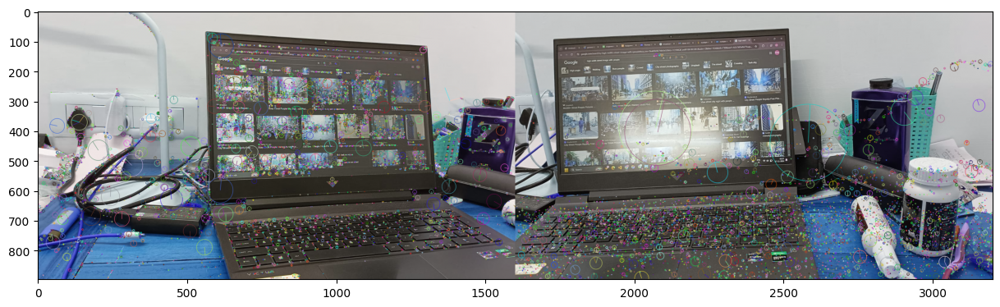

In [111]:
# Draw keypoints
img0_kp = features.drawKeypoints(list_images[0], k0)
img1_kp = features.drawKeypoints(list_images[1], k1)

# Combine images with drawn keypoints
plt_img = np.concatenate((img0_kp, img1_kp), axis=1)

# Display the result
plt.figure(figsize=(15, 15))
plt.imshow(convertResult(plt_img))
plt.show()


In [112]:
# Extract keypoints and descriptors
k0, f0 = features.findAndDescribeFeatures(list_images[0], opt='SIFT')
k1, f1 = features.findAndDescribeFeatures(list_images[1], opt='SIFT')

# Match features using Brute Force
matches = features.matchFeatures(f0, f1, ratio=0.85, opt='SIFT')
print(f"Number of good matches: {len(matches)}")


Number of good matches: 1691


In [113]:
# Compute homography matrix and mask
H, matMask = features.generateHomography(list_images[0], list_images[1], opt='SIFT')
print("Homography Matrix:\n", H)


Homography Matrix:
 [[ 8.07938387e-01  1.17395533e-02 -3.43032435e+02]
 [-1.02672873e-01  8.50467498e-01  8.11229511e+01]
 [-1.75053086e-04  3.92840140e-05  1.00000000e+00]]


In [114]:
#wrap 2 image
#choose list_images[0] as desination
pano,non_blend,left_side,right_side=stitch.warpTwoImages(list_images[0],list_images[1],True)


Bounding box: xmin=-343, xmax=1600, ymin=-116, ymax=900


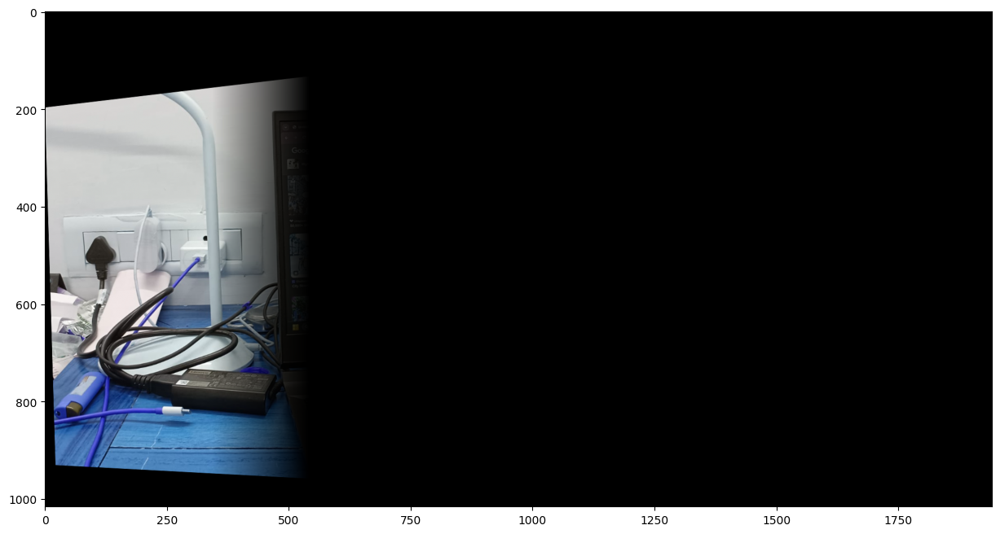

In [115]:
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(left_side))


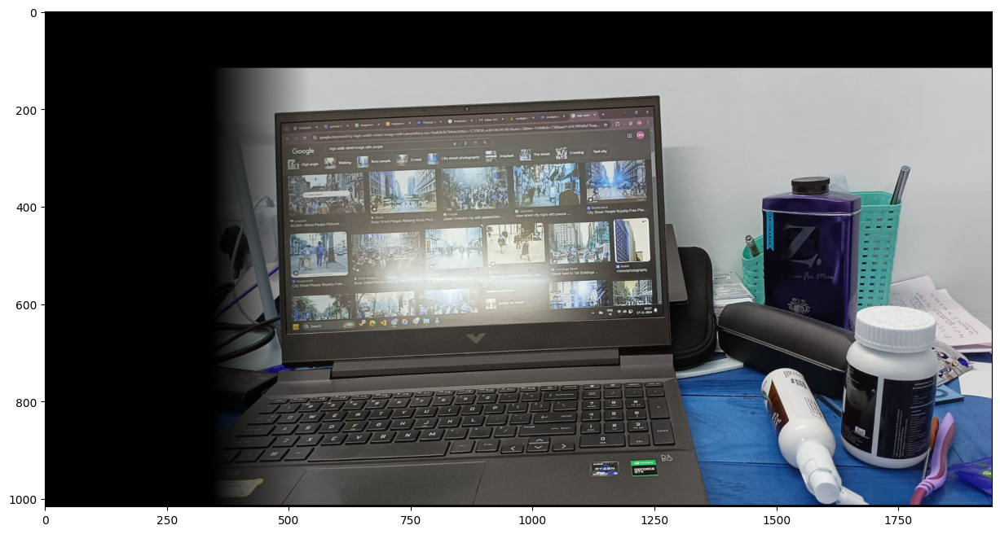

In [116]:
#display the rightside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(right_side))

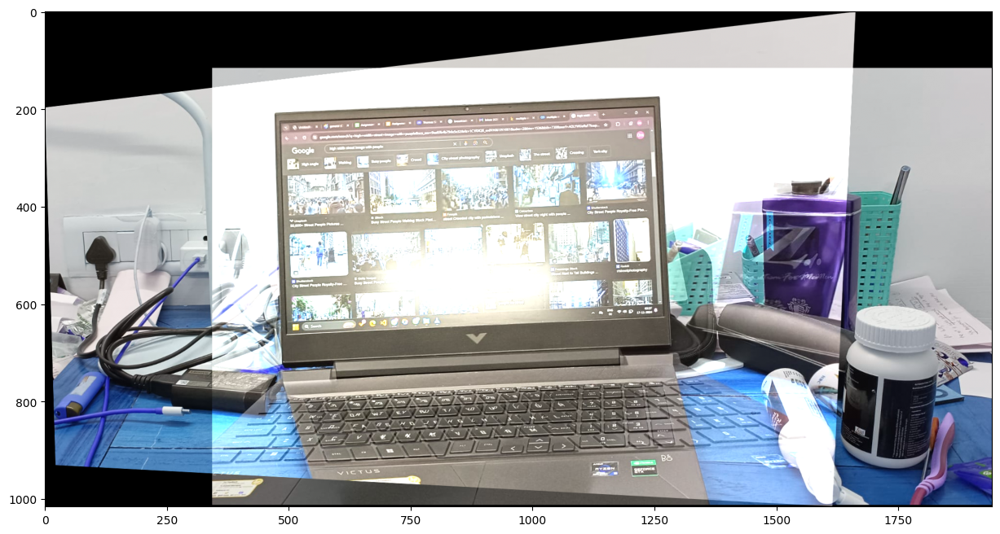

In [117]:
#display pano without cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend))

Bounding box: xmin=-343, xmax=1600, ymin=-116, ymax=900


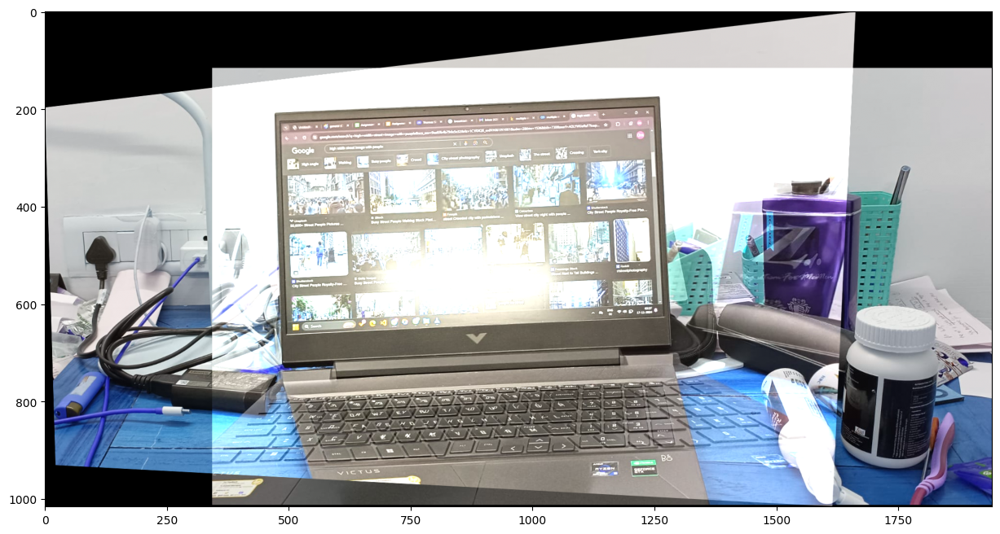

In [118]:
_,non_blend2,_,_=stitch.warpTwoImages(list_images[0],list_images[1],True)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend2))



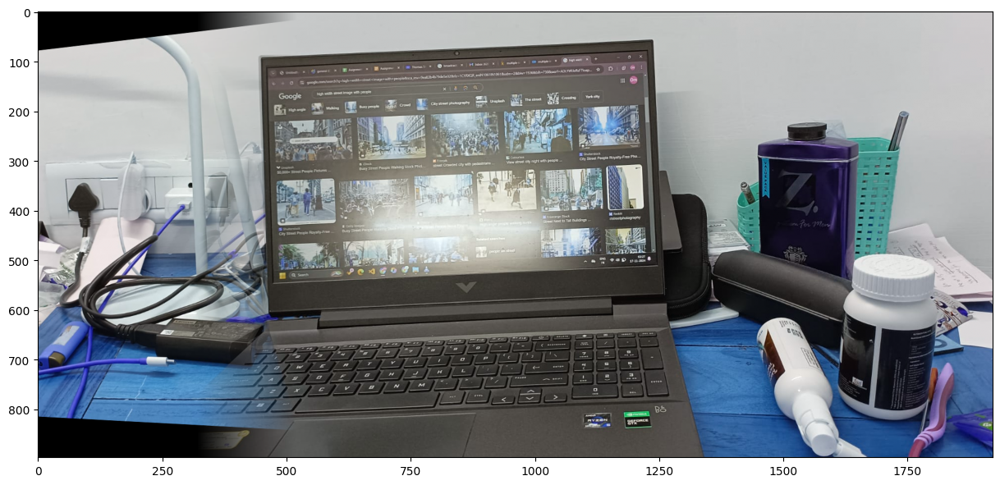

In [119]:
#pano after cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(pano))

#TRY2

In [156]:
image_1 = mpimg.imread('/content/31.jpg')
image_2 = mpimg.imread('/content/32.jpg')
image_3 = mpimg.imread('/content/3.jpg')
image_4 = mpimg.imread('/content/4.jpg')

In [157]:
#load images
list_images= [image_1,image_2,image_3,image_4]

In [158]:
print(list_images[0].shape)  # Should print something like (height, width, 3) for a color image
print(list_images[3].shape)  # Should print the shape for another image


(3052, 4070, 3)
(1080, 1620, 3)


In [159]:
#extract keypoints and descriptors using sift
k0,f0=features.findAndDescribeFeatures(list_images[0],opt='SIFT')
k1,f1=features.findAndDescribeFeatures(list_images[3],opt='SIFT')

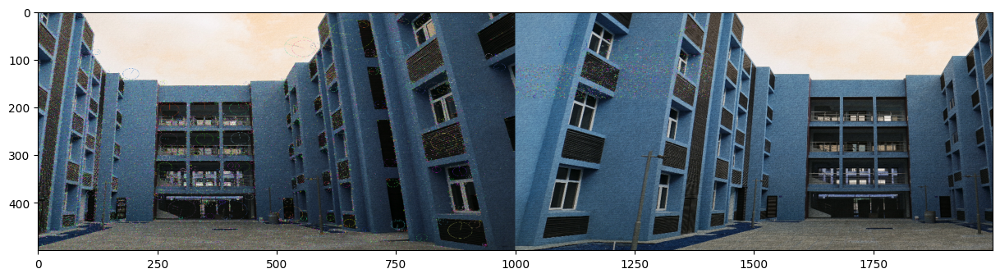

In [162]:
# Define a standard size
target_height = 500
target_width = 1000

# Resize both images to the target size
img0_kp = cv2.resize(img0_kp, (target_width, target_height))
img1_kp = cv2.resize(img1_kp, (target_width, target_height))

# Now concatenate the images
plt_img = np.concatenate((img0_kp, img1_kp), axis=1)

# Display the result
plt.figure(figsize=(15, 15))
plt.imshow(convertResult(plt_img))
plt.show()


In [163]:
# Extract keypoints and descriptors
k0, f0 = features.findAndDescribeFeatures(list_images[0], opt='SIFT')
k1, f1 = features.findAndDescribeFeatures(list_images[1], opt='SIFT')

# Match features using Brute Force
matches = features.matchFeatures(f0, f1, ratio=0.85, opt='SIFT')
print(f"Number of good matches: {len(matches)}")

Number of good matches: 41818


In [164]:
# Compute homography matrix and mask
H, matMask = features.generateHomography(list_images[0], list_images[1], opt='SIFT')
print("Homography Matrix:\n", H)

Homography Matrix:
 [[ 1.00000386e+00 -1.22391426e-06  1.40200042e+03]
 [ 3.56713797e-06  1.00000041e+00 -1.03002632e+02]
 [ 1.62357140e-09 -1.57147482e-10  1.00000000e+00]]


In [165]:
#wrap 2 image
#choose list_images[0] as desination
pano,non_blend,left_side,right_side=stitch.warpTwoImages(list_images[0],list_images[1],True)

Bounding box: xmin=0, xmax=5472, ymin=-103, ymax=2949


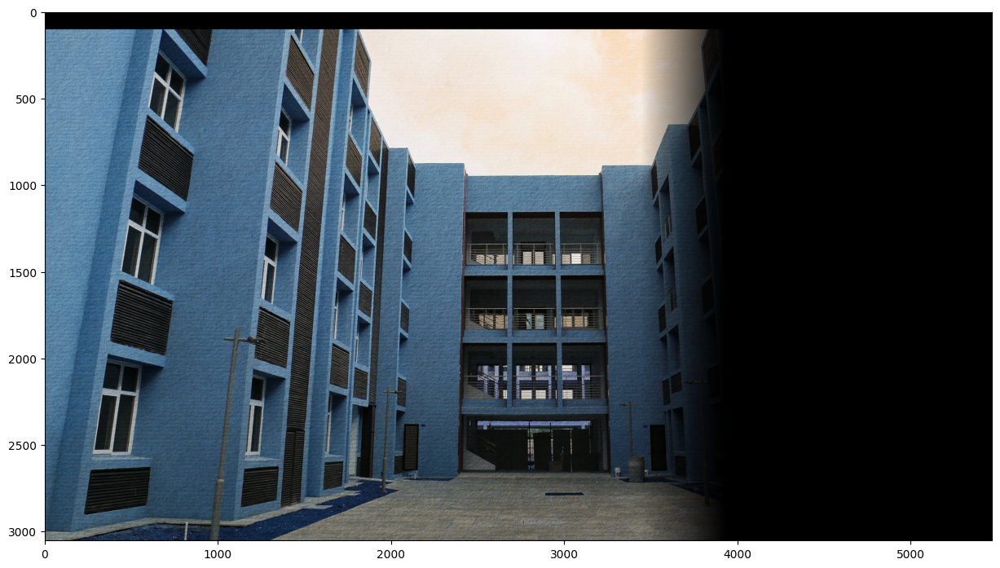

In [166]:
#display the leftside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(left_side))

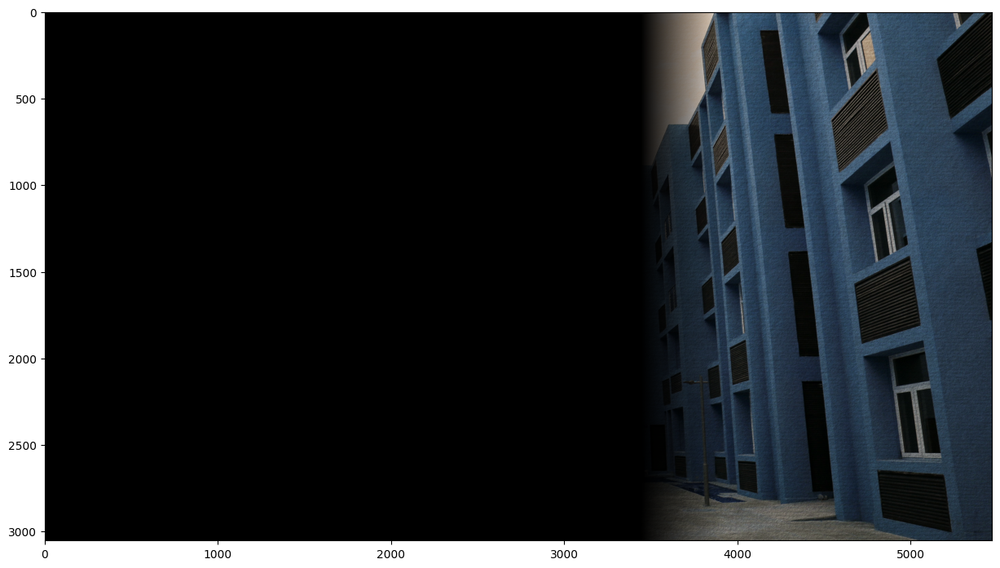

In [167]:
#display the rightside of pano before cropping
plt.figure(figsize=(15,15))
plt.imshow(convertResult(right_side))

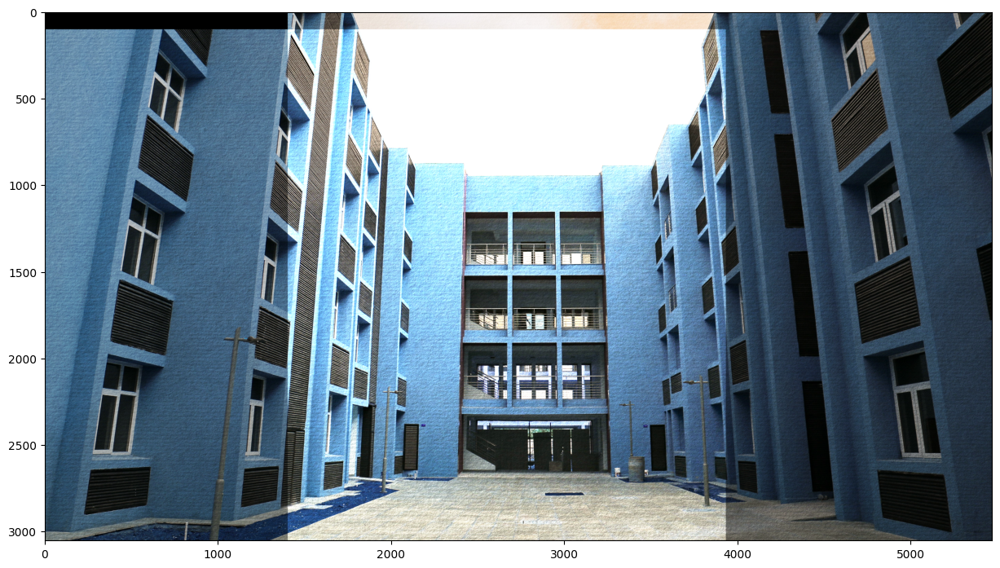

In [168]:
#display pano without cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend))

Bounding box: xmin=0, xmax=5472, ymin=-103, ymax=2949


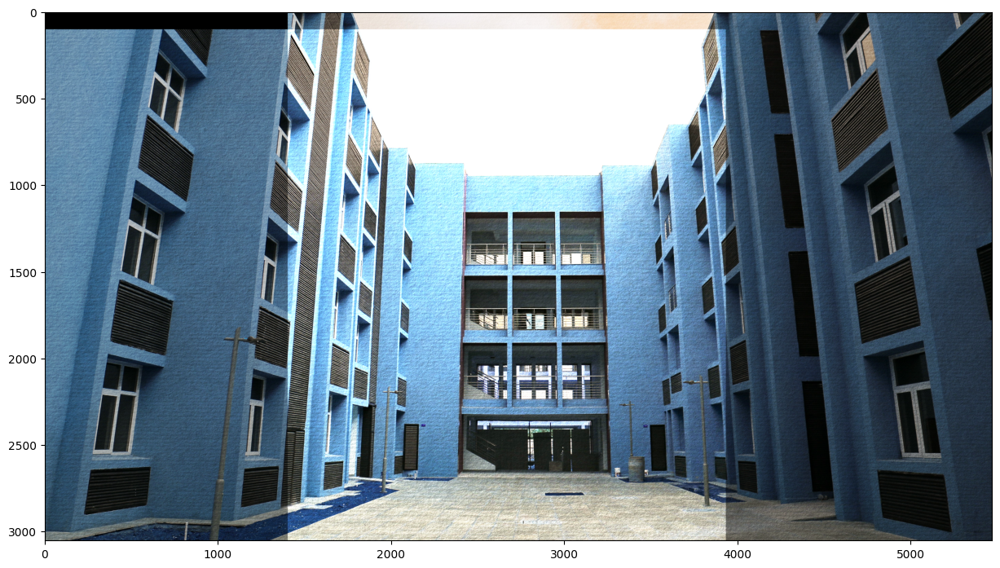

In [169]:
_,non_blend2,_,_=stitch.warpTwoImages(list_images[0],list_images[1],True)
plt.figure(figsize=(15,15))
plt.imshow(convertResult(non_blend2))

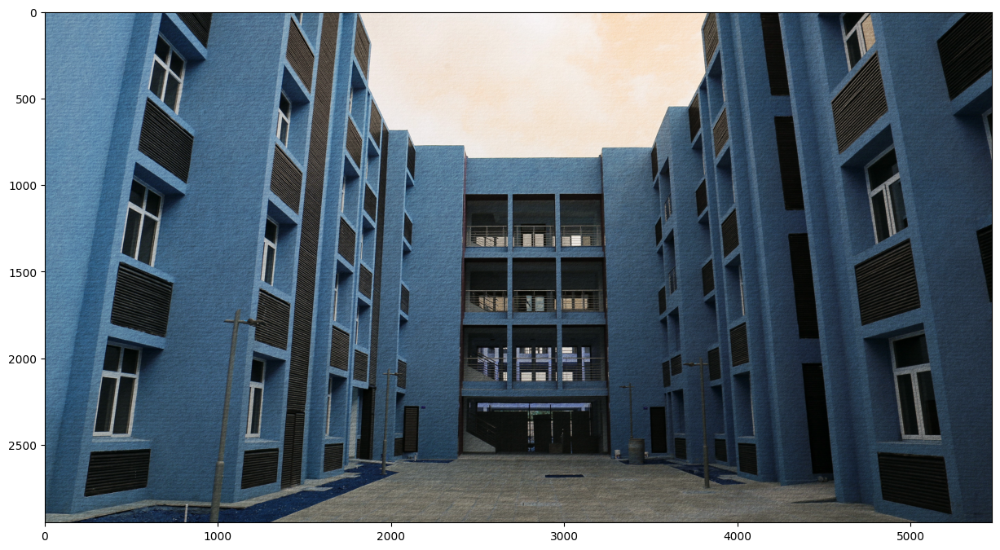

In [171]:
#pano after cropping and blending
plt.figure(figsize=(15,15))
plt.imshow(convertResult(pano))